# Stock Market Visualization

In [1]:
# Import Modules

import numpy as np
import pandas as pd
import os
import random
import copy
import matplotlib.pyplot as plt
import pandas

## Read the data from Stock folder

### Check how much data is available? 

In [7]:
from subprocess import check_output
print(check_output(["ls", "./Data"]).decode("utf8"))

FileNotFoundError: [WinError 2] The system cannot find the file specified

In [8]:
os.chdir('./Data/Stocks/')
list = os.listdir()
number_files = len(list)
print(number_files)

7195


In [7]:
os.chdir('../ETFs/')
list = os.listdir()
number_files = len(list)
print(number_files)

1344


### Choose 8 random stock data for analysis

In [9]:
#filenames = [x for x in os.listdir("./Stocks/") if x.endswith('.txt') and os.path.getsize(x) > 0]
filenames = random.sample([x for x in os.listdir() if x.endswith('.txt') 
                           and os.path.getsize(os.path.join('',x)) > 0], 8)
print(filenames)

['agc.us.txt', 'loan.us.txt', 'dgicb.us.txt', 'fsam.us.txt', 'lll.us.txt', 'gsvc.us.txt', 'immr.us.txt', 'cmrx.us.txt']


### Read data into dataframes

In [10]:
data = []
for filename in filenames:
    df = pd.read_csv(os.path.join('',filename), sep=',')
    label, _, _ = filename.split(sep='.')
    df['Label'] = label
    df['Date'] = pd.to_datetime(df['Date'])

    data.append(df)

In [11]:
data[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label
0,2007-05-24,10.930,10.930,10.930,10.930,0,0,agc
1,2007-05-25,10.940,10.959,10.930,10.930,144403,0,agc
2,2007-05-29,10.982,10.982,10.930,10.982,69176,0,agc
3,2007-05-30,10.982,11.027,10.945,11.009,51789,0,agc
4,2007-05-31,10.982,11.033,10.953,11.003,49050,0,agc


In [12]:
print(len(data))

8


## Add various Technical Indicators in the dataframe

There are many types of Technical Indicators. 
The Technical Indicators we are considering are:
- RSI, Volume (plain), Bollinger Bands, Aroon, Price Volume Trend, acceleration bands
- Stochastic, Chaikin Money Flow, Parabolic SAR, Rate of Change, Volume weighted average Price, momentum
- Commodity Channel Index, On Balance Volume, Keltner Channels, Triple Exponential Moving Average, Normalized Averager True Range ,directional movement indicators
- MACD, Money flowindex , Ichimoku, William %R, Volume MINMAX, adaptive moving average

In [13]:
TechIndicator = copy.deepcopy(data)

### Calculation of Relative Strength Index (RSI)

Benefit of day to day price

In [14]:
# Relative Strength Index
# Avg(PriceUp)/(Avg(PriceUP)+Avg(PriceDown)*100
# Where: PriceUp(t)=1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)>0};
#        PriceDown(t)=-1*(Price(t)-Price(t-1)){Price(t)- Price(t-1)<0};

def rsi(values):
    up = values[values>0].mean()
    down = -1*values[values<0].mean()
    return 100 * up / (up + down)


In [15]:
# Add Momentum_1D column for all 15 stocks.
# Momentum_1D = P(t) - P(t-1)
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum_1D'] = (TechIndicator[stock]['Close']-TechIndicator[stock]['Close'].shift(1)).fillna(0)
    TechIndicator[stock]['RSI_14D'] = TechIndicator[stock]['Momentum_1D'].rolling(center=False, window=14).apply(rsi).fillna(0)
TechIndicator[0].tail(5)

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,0.02,33.333333
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,-0.02,36.111111
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,-0.02,39.024390
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,-0.05,35.555556
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,-0.01,36.363636


In [16]:
### Calculation of Volume (Plain)m

In [17]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Volume_plain'] = TechIndicator[stock]['Volume'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,0.02,33.333333,108064
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,-0.02,36.111111,146405
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,-0.02,39.024390,321802
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,-0.05,35.555556,292757
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,-0.01,36.363636,131168


### Calculation of Bollinger Bands

In [18]:
def bbands(price, length=30, numsd=2):
    """ returns average, upper band, and lower band"""
    #ave = pd.stats.moments.rolling_mean(price,length)
    ave = price.rolling(window = length, center = False).mean()
    #sd = pd.stats.moments.rolling_std(price,length)
    sd = price.rolling(window = length, center = False).std()
    upband = ave + (sd*numsd)
    dnband = ave - (sd*numsd)
    return np.round(ave,3), np.round(upband,3), np.round(dnband,3)

In [19]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['BB_Middle_Band'], TechIndicator[stock]['BB_Upper_Band'], TechIndicator[stock]['BB_Lower_Band'] = bbands(TechIndicator[stock]['Close'], length=20, numsd=1)
    TechIndicator[stock]['BB_Middle_Band'] = TechIndicator[stock]['BB_Middle_Band'].fillna(0)
    TechIndicator[stock]['BB_Upper_Band'] = TechIndicator[stock]['BB_Upper_Band'].fillna(0)
    TechIndicator[stock]['BB_Lower_Band'] = TechIndicator[stock]['BB_Lower_Band'].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,0.02,33.333333,108064,6.183,6.224,6.142
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,-0.02,36.111111,146405,6.180,6.224,6.135
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,-0.02,39.024390,321802,6.174,6.222,6.126
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,-0.05,35.555556,292757,6.166,6.221,6.110
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,-0.01,36.363636,131168,6.156,6.219,6.094


### Calculation of Aroon Oscillator

how strong is the trend

In [20]:
def aroon(df, tf=25):
    aroonup = []
    aroondown = []
    x = tf
    while x< len(df['Date']):
        aroon_up = ((df['High'][x-tf:x].tolist().index(max(df['High'][x-tf:x])))/float(tf))*100
        aroon_down = ((df['Low'][x-tf:x].tolist().index(min(df['Low'][x-tf:x])))/float(tf))*100
        aroonup.append(aroon_up)
        aroondown.append(aroon_down)
        x+=1
    return aroonup, aroondown

In [21]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 25
    up, down = aroon(TechIndicator[stock])
    aroon_list = [x - y for x, y in zip(up,down)]
    if len(aroon_list)==0:
        aroon_list = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Aroon_Oscillator'] = aroon_list
    else:
        TechIndicator[stock]['Aroon_Oscillator'] = listofzeros+aroon_list


### Calculation of Price Volume Trend

PVT = [((CurrentClose - PreviousClose) / PreviousClose) x Volume] + PreviousPVT

In [22]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]["PVT"] = (TechIndicator[stock]['Momentum_1D']/ TechIndicator[stock]['Close'].shift(1))*TechIndicator[stock]['Volume']
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"]+TechIndicator[stock]["PVT"].shift(1)
    TechIndicator[stock]["PVT"] = TechIndicator[stock]["PVT"].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,0.02,33.333333,108064,6.183,6.224,6.142,-32.0,-264.916166
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,-0.02,36.111111,146405,6.180,6.224,6.135,-32.0,-123.938896
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,-0.02,39.024390,321802,6.174,6.222,6.126,-32.0,-1531.028913
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,-0.05,35.555556,292757,6.166,6.221,6.110,-64.0,-3456.949551
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,-0.01,36.363636,131168,6.156,6.219,6.094,-68.0,-2620.753412


### Calculation of Acceleration Bands

lower envelope bands around a simple moving average. 

In [23]:
def abands(df):
    #df['AB_Middle_Band'] = pd.rolling_mean(df['Close'], 20)
    df['AB_Middle_Band'] = df['Close'].rolling(window = 20, center=False).mean()
    # High * ( 1 + 4 * (High - Low) / (High + Low))
    df['aupband'] = df['High'] * (1 + 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Upper_Band'] = df['aupband'].rolling(window=20, center=False).mean()
    # Low *(1 - 4 * (High - Low)/ (High + Low))
    df['adownband'] = df['Low'] * (1 - 4 * (df['High']-df['Low'])/(df['High']+df['Low']))
    df['AB_Lower_Band'] = df['adownband'].rolling(window=20, center=False).mean()

In [24]:
for stock in range(len(TechIndicator)):
    abands(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,Momentum_1D,RSI_14D,...,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,aupband,AB_Upper_Band,adownband,AB_Lower_Band
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,0.02,33.333333,...,6.183,6.224,6.142,-32.0,-264.916166,6.18301,6.220146,6.300407,6.070146,6.067932
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,-0.02,36.111111,...,6.180,6.224,6.135,-32.0,-123.938896,6.17950,6.238074,6.299139,5.969074,6.060139
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,-0.02,39.024390,...,6.174,6.222,6.126,-32.0,-1531.028913,6.17400,6.220593,6.292690,5.920593,6.053590
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,-0.05,35.555556,...,6.166,6.221,6.110,-64.0,-3456.949551,6.16550,6.354420,6.296404,5.749420,6.034554
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,-0.01,36.363636,...,6.156,6.219,6.094,-68.0,-2620.753412,6.15650,6.170598,6.289421,5.870598,6.022571


## Drop unwanted columns

In [25]:
columns2Drop = ['Momentum_1D', 'aupband', 'adownband']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band
0,2007-05-24,10.930,10.930,10.930,10.930,0,0,agc,0.0,0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
1,2007-05-25,10.940,10.959,10.930,10.930,144403,0,agc,0.0,144403,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0
2,2007-05-29,10.982,10.982,10.930,10.982,69176,0,agc,0.0,69176,0.0,0.0,0.0,0.0,329.108143,0.0,0.0,0.0
3,2007-05-30,10.982,11.027,10.945,11.009,51789,0,agc,0.0,51789,0.0,0.0,0.0,0.0,456.434950,0.0,0.0,0.0
4,2007-05-31,10.982,11.033,10.953,11.003,49050,0,agc,0.0,49050,0.0,0.0,0.0,0.0,100.594134,0.0,0.0,0.0


### Calculation of Stochastic Oscillator (%K and %D)

price as a percentage between 0 and 10

In [26]:
def STOK(df, n):
    df['STOK'] = ((df['Close'] - df['Low'].rolling(window=n, center=False).mean()) / (df['High'].rolling(window=n, center=False).max() - df['Low'].rolling(window=n, center=False).min())) * 100
    df['STOD'] = df['STOK'].rolling(window = 3, center=False).mean()

In [27]:
for stock in range(len(TechIndicator)):
    STOK(TechIndicator[stock], 4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,33.333333,108064,6.183,6.224,6.142,-32.0,-264.916166,6.18301,6.300407,6.067932,-9.868649e-13,0.264550
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,36.111111,146405,6.180,6.224,6.135,-32.0,-123.938896,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,39.024390,321802,6.174,6.222,6.126,-32.0,-1531.028913,6.17400,6.292690,6.053590,7.916667e-01,-0.286928
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,35.555556,292757,6.166,6.221,6.110,-64.0,-3456.949551,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,36.363636,131168,6.156,6.219,6.094,-68.0,-2620.753412,6.15650,6.289421,6.022571,4.397163e+00,-1.935107


### Calculation of Chaikin Money Flow

เครื่องมือการวิเคราะห์ปริมาณการซื้อขายในการเทรดในช่วง 20 วันย้อนหลัง ที่นำมาสร้างเป็น Oscillator แกว่งตัวระหว่างเส้น 0 เพื่อเทียบแรงซื้อแรงขายที่เกิดขึ้น

1. Money Flow Multiplier = [(Close  – Low) – (High – Close)] /(High – Low) 
2. Money Flow Volume = Money Flow Multiplier x Volume for the Period
3. 20-period CMF = 20-period Sum of Money Flow Volume / 20 period Sum of Volume

สังเกตในส่วนของ Money Flow Multiplier มันจะให้ค่าเป็นบวกก็ต่อเมื่อ ราคาปิด อยู่สูงกว่าครึ่งของช่วง High-Low ตรงกันข้ามจะให้ค่าติดลบก็ต่อเมื่อ ราคาปิด อยู่ต่ำกว่าครึ่งของช่วง High-Low และเมื่อ Multiplier = +1 เมื่อราคาปิดที่บริเวณ High ส่วน Multiplier = -1 เมื่อราคาปิดที่บริเวณ Low 

In [28]:
def CMFlow(df, tf):
    CHMF = []
    MFMs = []
    MFVs = []
    x = tf
    
    while x < len(df['Date']):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        
        MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
        MFV = MFM*PeriodVolume
        
        MFMs.append(MFM)
        MFVs.append(MFV)
        x+=1
    
    y = tf
    while y < len(MFVs):
        PeriodVolume = 0
        volRange = df['Volume'][x-tf:x]
        for eachVol in volRange:
            PeriodVolume += eachVol
        consider = MFVs[y-tf:y]
        tfsMFV = 0
        
        for eachMFV in consider:
            tfsMFV += eachMFV
        
        tfsCMF = tfsMFV/PeriodVolume
        CHMF.append(tfsCMF)
        y+=1
    return CHMF

In [29]:
for stock in range(len(TechIndicator)):
    listofzeros = [0] * 40
    CHMF = CMFlow(TechIndicator[stock], 20)
    if len(CHMF)==0:
        CHMF = [0] * TechIndicator[stock].shape[0]
        TechIndicator[stock]['Chaikin_MF'] = CHMF
    else:
        TechIndicator[stock]['Chaikin_MF'] = listofzeros+CHMF
TechIndicator[0].tail()

C:\Users\safar\AppData\Local\Temp\ipykernel_168176\299586020.py:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])
C:\Users\safar\AppData\Local\Temp\ipykernel_168176\299586020.py:13: RuntimeWarning: invalid value encountered in double_scalars
  MFM = ((df['Close'][x] - df['Low'][x]) - (df['High'][x] - df['Close'][x])) / (df['High'][x] - df['Low'][x])


,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Upper_Band,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF
2632,2017-11-06,6.13,6.16,6.1300,6.13,108064,0,agc,33.333333,108064,...,6.224,6.142,-32.0,-264.916166,6.18301,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335
2633,2017-11-07,6.13,6.13,6.0762,6.11,146405,0,agc,36.111111,146405,...,6.224,6.135,-32.0,-123.938896,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330
2634,2017-11-08,6.10,6.10,6.0400,6.09,321802,0,agc,39.024390,321802,...,6.222,6.126,-32.0,-1531.028913,6.17400,6.292690,6.053590,7.916667e-01,-0.286928,0.573723
2635,2017-11-09,6.05,6.11,5.9890,6.04,292757,0,agc,35.555556,292757,...,6.221,6.110,-64.0,-3456.949551,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566
2636,2017-11-10,6.01,6.05,5.9900,6.03,131168,0,agc,36.363636,131168,...,6.219,6.094,-68.0,-2620.753412,6.15650,6.289421,6.022571,4.397163e+00,-1.935107,0.528585


### Calculation of Parabolic SAR

In [30]:
def psar(df, iaf = 0.02, maxaf = 0.2):
    length = len(df)
    dates = (df['Date'])
    high = (df['High'])
    low = (df['Low'])
    close = (df['Close'])
    psar = df['Close'][0:len(df['Close'])]
    psarbull = [None] * length
    psarbear = [None] * length
    bull = True
    af = iaf
    ep = df['Low'][0]
    hp = df['High'][0]
    lp = df['Low'][0]
    for i in range(2,length):
        if bull:
            psar[i] = psar[i - 1] + af * (hp - psar[i - 1])
        else:
            psar[i] = psar[i - 1] + af * (lp - psar[i - 1])
        reverse = False
        if bull:
            if df['Low'][i] < psar[i]:
                bull = False
                reverse = True
                psar[i] = hp
                lp = df['Low'][i]
                af = iaf
        else:
            if df['High'][i] > psar[i]:
                bull = True
                reverse = True
                psar[i] = lp
                hp = df['High'][i]
                af = iaf
        if not reverse:
            if bull:
                if df['High'][i] > hp:
                    hp = df['High'][i]
                    af = min(af + iaf, maxaf)
                if df['Low'][i - 1] < psar[i]:
                    psar[i] = df['Low'][i - 1]
                if df['Low'][i - 2] < psar[i]:
                    psar[i] = df['Low'][i - 2]
            else:
                if df['Low'][i] < lp:
                    lp = df['Low'][i]
                    af = min(af + iaf, maxaf)
                if df['High'][i - 1] > psar[i]:
                    psar[i] = df['High'][i - 1]
                if df['High'][i - 2] > psar[i]:
                    psar[i] = df['High'][i - 2]
        if bull:
            psarbull[i] = psar[i]
        else:
            psarbear[i] = psar[i]
    #return {"dates":dates, "high":high, "low":low, "close":close, "psar":psar, "psarbear":psarbear, "psarbull":psarbull}
    #return psar, psarbear, psarbull
    df['psar'] = psar
    #df['psarbear'] = psarbear
    #df['psarbull'] = psarbull

In [31]:
for stock in range(len(TechIndicator)):
    psar(TechIndicator[stock])

TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,BB_Lower_Band,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar
2632,2017-11-06,6.13,6.16,6.1300,6.189600,108064,0,agc,33.333333,108064,...,6.142,-32.0,-264.916166,6.18301,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335,6.189600
2633,2017-11-07,6.13,6.13,6.0762,6.180032,146405,0,agc,36.111111,146405,...,6.135,-32.0,-123.938896,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330,6.180032
2634,2017-11-08,6.10,6.10,6.0400,6.171229,321802,0,agc,39.024390,321802,...,6.126,-32.0,-1531.028913,6.17400,6.292690,6.053590,7.916667e-01,-0.286928,0.573723,6.171229
2635,2017-11-09,6.05,6.11,5.9890,6.158106,292757,0,agc,35.555556,292757,...,6.110,-64.0,-3456.949551,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566,6.158106
2636,2017-11-10,6.01,6.05,5.9900,6.137814,131168,0,agc,36.363636,131168,...,6.094,-68.0,-2620.753412,6.15650,6.289421,6.022571,4.397163e+00,-1.935107,0.528585,6.137814


### Calculation of Price Rate of Change

In [32]:
# ROC = [(Close - Close n periods ago) / (Close n periods ago)] * 100
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['ROC'] = ((TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(12))/(TechIndicator[stock]['Close'].shift(12)))*100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Aroon_Oscillator,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC
2632,2017-11-06,6.13,6.16,6.1300,6.189600,108064,0,agc,33.333333,108064,...,-32.0,-264.916166,6.18301,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335,6.189600,0.103282
2633,2017-11-07,6.13,6.13,6.0762,6.180032,146405,0,agc,36.111111,146405,...,-32.0,-123.938896,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330,6.180032,-0.249660
2634,2017-11-08,6.10,6.10,6.0400,6.171229,321802,0,agc,39.024390,321802,...,-32.0,-1531.028913,6.17400,6.292690,6.053590,7.916667e-01,-0.286928,0.573723,6.171229,-1.418060
2635,2017-11-09,6.05,6.11,5.9890,6.158106,292757,0,agc,35.555556,292757,...,-64.0,-3456.949551,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566,6.158106,-1.602542
2636,2017-11-10,6.01,6.05,5.9900,6.137814,131168,0,agc,36.363636,131168,...,-68.0,-2620.753412,6.15650,6.289421,6.022571,4.397163e+00,-1.935107,0.528585,6.137814,-1.902213


### Calculation of Volume Weighted Average Price

In [33]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['VWAP'] = np.cumsum(TechIndicator[stock]['Volume'] * (TechIndicator[stock]['High'] + TechIndicator[stock]['Low'])/2) / np.cumsum(TechIndicator[stock]['Volume'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,PVT,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP
2632,2017-11-06,6.13,6.16,6.1300,6.189600,108064,0,agc,33.333333,108064,...,-264.916166,6.18301,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335,6.189600,0.103282,5.059646
2633,2017-11-07,6.13,6.13,6.0762,6.180032,146405,0,agc,36.111111,146405,...,-123.938896,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330,6.180032,-0.249660,5.059969
2634,2017-11-08,6.10,6.10,6.0400,6.171229,321802,0,agc,39.024390,321802,...,-1531.028913,6.17400,6.292690,6.053590,7.916667e-01,-0.286928,0.573723,6.171229,-1.418060,5.060656
2635,2017-11-09,6.05,6.11,5.9890,6.158106,292757,0,agc,35.555556,292757,...,-3456.949551,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566,6.158106,-1.602542,5.061268
2636,2017-11-10,6.01,6.05,5.9900,6.137814,131168,0,agc,36.363636,131168,...,-2620.753412,6.15650,6.289421,6.022571,4.397163e+00,-1.935107,0.528585,6.137814,-1.902213,5.061534


### Calculation of Momentum 

In [34]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['Momentum'] = TechIndicator[stock]['Close'] - TechIndicator[stock]['Close'].shift(4)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Middle_Band,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum
2632,2017-11-06,6.13,6.16,6.1300,6.189600,108064,0,agc,33.333333,108064,...,6.18301,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335,6.189600,0.103282,5.059646,-0.025708
2633,2017-11-07,6.13,6.13,6.0762,6.180032,146405,0,agc,36.111111,146405,...,6.17950,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330,6.180032,-0.249660,5.059969,-0.023651
2634,2017-11-08,6.10,6.10,6.0400,6.171229,321802,0,agc,39.024390,321802,...,6.17400,6.292690,6.053590,7.916667e-01,-0.286928,0.573723,6.171229,-1.418060,5.060656,-0.028771
2635,2017-11-09,6.05,6.11,5.9890,6.158106,292757,0,agc,35.555556,292757,...,6.16550,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566,6.158106,-1.602542,5.061268,-0.041894
2636,2017-11-10,6.01,6.05,5.9900,6.137814,131168,0,agc,36.363636,131168,...,6.15650,6.289421,6.022571,4.397163e+00,-1.935107,0.528585,6.137814,-1.902213,5.061534,-0.051786


### Calculation of Commodity Channel Index

overbought or oversold.

In [35]:
def CCI(df, n, constant):
    TP = (df['High'] + df['Low'] + df['Close']) / 3
    CCI = pd.Series((TP - TP.rolling(window=n, center=False).mean()) / (constant * TP.rolling(window=n, center=False).std())) #, name = 'CCI_' + str(n))
    return CCI

In [36]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['CCI'] = CCI(TechIndicator[stock], 20, 0.015)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[0].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Upper_Band,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI
2632,2017-11-06,6.13,6.16,6.1300,6.189600,108064,0,agc,33.333333,108064,...,6.300407,6.067932,-9.868649e-13,0.264550,-0.728335,6.189600,0.103282,5.059646,-0.025708,-76.373374
2633,2017-11-07,6.13,6.13,6.0762,6.180032,146405,0,agc,36.111111,146405,...,6.299139,6.060139,-1.652452e+00,-9.810077,-1.043330,6.180032,-0.249660,5.059969,-0.023651,-148.608978
2634,2017-11-08,6.10,6.10,6.0400,6.171229,321802,0,agc,39.024390,321802,...,6.292690,6.053590,7.916667e-01,-0.286928,0.573723,6.171229,-1.418060,5.060656,-0.028771,-169.191866
2635,2017-11-09,6.05,6.11,5.9890,6.158106,292757,0,agc,35.555556,292757,...,6.296404,6.034554,-1.099415e+01,-3.951646,1.133566,6.158106,-1.602542,5.061268,-0.041894,-163.131705
2636,2017-11-10,6.01,6.05,5.9900,6.137814,131168,0,agc,36.363636,131168,...,6.289421,6.022571,4.397163e+00,-1.935107,0.528585,6.137814,-1.902213,5.061534,-0.051786,-163.336836


Deviation Detect
https://dspyt.com/advanced-realized-volatility-and-quarticity/

### Calculation of On Balance Volume

If the closing price is above the prior close price then: 
Current OBV = Previous OBV + Current Volume

If the closing price is below the prior close price then: 
Current OBV = Previous OBV  -  Current Volume

If the closing prices equals the prior close price then:
Current OBV = Previous OBV (no change)

In [37]:
for stock in range(len(TechIndicator)):
    new = (TechIndicator[stock]['Volume'] * (~TechIndicator[stock]['Close'].diff().le(0) * 2 -1)).cumsum()
    TechIndicator[stock]['OBV'] = new
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,AB_Lower_Band,STOK,STOD,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV
1641,2017-11-06,5.47,5.6490,5.4700,5.817802,28104,0,gsvc,38.364780,28104,...,5.224827,68.625000,33.657828,-0.941876,5.817802,1.354514,8.632821,-0.072334,-60.079287,-25877674
1642,2017-11-07,5.65,6.0600,5.6400,5.410000,396528,0,gsvc,45.856354,396528,...,5.224724,60.550847,47.780838,0.311130,5.410000,-9.833333,8.630787,-0.460931,-30.204670,-26274202
1643,2017-11-08,5.96,6.1486,5.9104,5.423000,401667,0,gsvc,48.387097,401667,...,5.234317,69.208665,66.128171,-0.318717,5.423000,-9.489953,8.628862,-0.429493,81.109982,-25872535
1644,2017-11-09,6.25,6.3500,5.9900,5.452024,193881,0,gsvc,54.782609,193881,...,5.228528,28.113636,52.624383,-0.732777,5.452024,-8.880350,8.627984,-0.382770,146.682072,-25678654
1645,2017-11-10,6.00,6.5700,6.0000,5.505903,197789,0,gsvc,60.000000,197789,...,5.199146,60.741935,52.688079,-1.685514,5.505903,-7.855640,8.627130,-0.311899,170.719418,-25480865


### Calcualtion of Keltner Channels

In [38]:
#Keltner Channel  
def KELCH(df, n):  
    KelChM = pd.Series(((df['High'] + df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChM_' + str(n))  
    KelChU = pd.Series(((4 * df['High'] - 2 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChU_' + str(n))  
    KelChD = pd.Series(((-2 * df['High'] + 4 * df['Low'] + df['Close']) / 3).rolling(window =n, center=False).mean(), name = 'KelChD_' + str(n))    
    return KelChM, KelChD, KelChU

In [39]:
for stock in range(len(TechIndicator)):
    KelchM, KelchD, KelchU = KELCH(TechIndicator[stock], 14)
    TechIndicator[stock]['Kelch_Upper'] = KelchU
    TechIndicator[stock]['Kelch_Middle'] = KelchM
    TechIndicator[stock]['Kelch_Down'] = KelchD
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Chaikin_MF,psar,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down
1641,2017-11-06,5.47,5.6490,5.4700,5.817802,28104,0,gsvc,38.364780,28104,...,-0.941876,5.817802,1.354514,8.632821,-0.072334,-60.079287,-25877674,5.934115,5.736115,5.538115
1642,2017-11-07,5.65,6.0600,5.6400,5.410000,396528,0,gsvc,45.856354,396528,...,0.311130,5.410000,-9.833333,8.630787,-0.460931,-30.204670,-26274202,5.951245,5.728245,5.505245
1643,2017-11-08,5.96,6.1486,5.9104,5.423000,401667,0,gsvc,48.387097,401667,...,-0.318717,5.423000,-9.489953,8.628862,-0.429493,81.109982,-25872535,5.961068,5.728339,5.495610
1644,2017-11-09,6.25,6.3500,5.9900,5.452024,193881,0,gsvc,54.782609,193881,...,-0.732777,5.452024,-8.880350,8.627984,-0.382770,146.682072,-25678654,5.970401,5.735530,5.500659
1645,2017-11-10,6.00,6.5700,6.0000,5.505903,197789,0,gsvc,60.000000,197789,...,-1.685514,5.505903,-7.855640,8.627130,-0.311899,170.719418,-25480865,6.008837,5.748966,5.489094


### Calculation of Triple Exponential Moving Average

Triple Exponential MA Formula:

T-EMA = (3*EMA – 3*EMA(EMA)) + EMA(EMA(EMA))

Where:

EMA = EMA(1) + α * (Close – EMA(1))

α = 2 / (N + 1)

N = The smoothing period.

In [40]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['EMA'] = TechIndicator[stock]['Close'].ewm(span=3,min_periods=0,adjust=True,ignore_na=False).mean()
    
    TechIndicator[stock] = TechIndicator[stock].fillna(0)

for stock in range(len(TechIndicator)):
    TechIndicator[stock]['TEMA'] = (3 * TechIndicator[stock]['EMA'] - 3 * TechIndicator[stock]['EMA'] * TechIndicator[stock]['EMA']) + (TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA']*TechIndicator[stock]['EMA'])
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ROC,VWAP,Momentum,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,EMA,TEMA
1641,2017-11-06,5.47,5.6490,5.4700,5.817802,28104,0,gsvc,38.364780,28104,...,1.354514,8.632821,-0.072334,-60.079287,-25877674,5.934115,5.736115,5.538115,5.835387,114.055992
1642,2017-11-07,5.65,6.0600,5.6400,5.410000,396528,0,gsvc,45.856354,396528,...,-9.833333,8.630787,-0.460931,-30.204670,-26274202,5.951245,5.728245,5.505245,5.622693,99.783686
1643,2017-11-08,5.96,6.1486,5.9104,5.423000,401667,0,gsvc,48.387097,401667,...,-9.489953,8.628862,-0.429493,81.109982,-25872535,5.961068,5.728339,5.495610,5.522847,93.519991
1644,2017-11-09,6.25,6.3500,5.9900,5.452024,193881,0,gsvc,54.782609,193881,...,-8.880350,8.627984,-0.382770,146.682072,-25678654,5.970401,5.735530,5.500659,5.487435,91.363825
1645,2017-11-10,6.00,6.5700,6.0000,5.505903,197789,0,gsvc,60.000000,197789,...,-7.855640,8.627130,-0.311899,170.719418,-25480865,6.008837,5.748966,5.489094,5.496669,91.922788


### Calculation of Normalized Average True Range

True Range = Highest of (HIgh - low, abs(High - previous close), abs(low - previous close))

Average True Range = 14 day MA of True Range

Normalized Average True Range = ATR / Close * 100

In [41]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['HL'] = TechIndicator[stock]['High'] - TechIndicator[stock]['Low']
    TechIndicator[stock]['absHC'] = abs(TechIndicator[stock]['High'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['absLC'] = abs(TechIndicator[stock]['Low'] - TechIndicator[stock]['Close'].shift(1))
    TechIndicator[stock]['TR'] = TechIndicator[stock][['HL','absHC','absLC']].max(axis=1)
    TechIndicator[stock]['ATR'] = TechIndicator[stock]['TR'].rolling(window=14).mean()
    TechIndicator[stock]['NATR'] = (TechIndicator[stock]['ATR'] / TechIndicator[stock]['Close']) *100
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,EMA,TEMA,HL,absHC,absLC,TR,ATR,NATR
1641,2017-11-06,5.47,5.6490,5.4700,5.817802,28104,0,gsvc,38.364780,28104,...,5.736115,5.538115,5.835387,114.055992,0.1790,0.185794,0.364794,0.364794,0.386879,6.649913
1642,2017-11-07,5.65,6.0600,5.6400,5.410000,396528,0,gsvc,45.856354,396528,...,5.728245,5.505245,5.622693,99.783686,0.4200,0.242198,0.177802,0.420000,0.396993,7.338125
1643,2017-11-08,5.96,6.1486,5.9104,5.423000,401667,0,gsvc,48.387097,401667,...,5.728339,5.495610,5.522847,93.519991,0.2382,0.738600,0.500400,0.738600,0.433360,7.991141
1644,2017-11-09,6.25,6.3500,5.9900,5.452024,193881,0,gsvc,54.782609,193881,...,5.735530,5.500659,5.487435,91.363825,0.3600,0.927000,0.567000,0.927000,0.476002,8.730747
1645,2017-11-10,6.00,6.5700,6.0000,5.505903,197789,0,gsvc,60.000000,197789,...,5.748966,5.489094,5.496669,91.922788,0.5700,1.117976,0.547976,1.117976,0.530858,9.641614


### Calculation of Average Directional Movement Index (ADX)

Calculating the DMI can actually be broken down into two parts. 
First, calculating the +DI and -DI, and second, calculating the ADX.

To calculate the +DI and -DI you need to find the +DM and -DM (Directional Movement). 
+DM and -DM are calculated using the High, Low and Close for each period. 
You can then calculate the following:

Current High - Previous High = UpMove
Previous Low - Current Low = DownMove

If UpMove > DownMove and UpMove > 0, then +DM = UpMove, else +DM = 0
If DownMove > Upmove and Downmove > 0, then -DM = DownMove, else -DM = 0

Once you have the current +DM and -DM calculated, the +DM and -DM lines can be 
calculated and plotted based on the number of user defined periods.

+DI = 100 times Exponential Moving Average of (+DM / Average True Range)
-DI = 100 times Exponential Moving Average of (-DM / Average True Range)

Now that -+DX and -DX have been calculated, the last step is calculating the ADX.

ADX = 100 times the Exponential Moving Average of the Absolute Value of (+DI - -DI) / (+DI + -DI)

In [42]:
def DMI(df, period):
    df['UpMove'] = df['High'] - df['High'].shift(1)
    df['DownMove'] = df['Low'].shift(1) - df['Low']
    df['Zero'] = 0

    df['PlusDM'] = np.where((df['UpMove'] > df['DownMove']) & (df['UpMove'] > df['Zero']), df['UpMove'], 0)
    df['MinusDM'] = np.where((df['UpMove'] < df['DownMove']) & (df['DownMove'] > df['Zero']), df['DownMove'], 0)

    df['plusDI'] = 100 * (df['PlusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()
    df['minusDI'] = 100 * (df['MinusDM']/df['ATR']).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()

    df['ADX'] = 100 * (abs((df['plusDI'] - df['minusDI'])/(df['plusDI'] + df['minusDI']))).ewm(span=period,min_periods=0,adjust=True,ignore_na=False).mean()


In [43]:
for stock in range(len(TechIndicator)):
    DMI(TechIndicator[stock], 14)
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[5].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ATR,NATR,UpMove,DownMove,Zero,PlusDM,MinusDM,plusDI,minusDI,ADX
1641,2017-11-06,5.47,5.6490,5.4700,5.817802,28104,0,gsvc,38.364780,28104,...,0.386879,6.649913,-0.0210,0.0310,0,0.0000,0.031,2.391978,5.983177,39.760810
1642,2017-11-07,5.65,6.0600,5.6400,5.410000,396528,0,gsvc,45.856354,396528,...,0.396993,7.338125,0.4110,-0.1700,0,0.4110,0.000,15.876832,5.185420,41.227504
1643,2017-11-08,5.96,6.1486,5.9104,5.423000,401667,0,gsvc,48.387097,401667,...,0.433360,7.991141,0.0886,-0.2704,0,0.0886,0.000,16.485910,4.494031,43.351675
1644,2017-11-09,6.25,6.3500,5.9900,5.452024,193881,0,gsvc,54.782609,193881,...,0.476002,8.730747,0.2014,-0.0796,0,0.2014,0.000,19.929216,3.894826,46.545238
1645,2017-11-10,6.00,6.5700,6.0000,5.505903,197789,0,gsvc,60.000000,197789,...,0.530858,9.641614,0.2200,-0.0100,0,0.2200,0.000,22.797635,3.375516,50.233375


## Drop Unwanted Columns

In [44]:
columns2Drop = ['UpMove', 'DownMove', 'ATR', 'PlusDM', 'MinusDM', 'Zero', 'EMA', 'HL', 'absHC', 'absLC', 'TR']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,CCI,OBV,Kelch_Upper,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX
0,2005-02-28,10.308,10.492,10.300,10.484,9275,0,dgicb,0.0,9275,...,0.0,9275,0.0,0.0,0.0,854.050292,0.0,0.0,0.0,0.0
1,2005-03-01,10.492,10.492,10.484,10.484,523,0,dgicb,0.0,523,...,0.0,8752,0.0,0.0,0.0,854.050292,0.0,0.0,0.0,0.0
2,2005-03-02,10.258,10.258,10.258,10.492,210,0,dgicb,0.0,210,...,0.0,8962,0.0,0.0,0.0,855.284435,0.0,0.0,0.0,0.0
3,2005-03-03,10.502,10.668,10.502,10.258,3372,0,dgicb,0.0,3372,...,0.0,5590,0.0,0.0,0.0,822.498578,0.0,0.0,0.0,0.0
4,2005-03-04,10.678,10.714,10.668,10.258,1288,0,dgicb,0.0,1288,...,0.0,4302,0.0,0.0,0.0,807.971267,0.0,0.0,0.0,0.0


### Calculation of MACD

MACD: (12-day EMA - 26-day EMA)

In [45]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['26_ema'] = TechIndicator[stock]['Close'].ewm(span=26,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['12_ema'] = TechIndicator[stock]['Close'].ewm(span=12,min_periods=0,adjust=True,ignore_na=False).mean()
    TechIndicator[stock]['MACD'] = TechIndicator[stock]['12_ema'] - TechIndicator[stock]['26_ema']
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Kelch_Middle,Kelch_Down,TEMA,NATR,plusDI,minusDI,ADX,26_ema,12_ema,MACD
1349,2017-10-24,13.239,14.578,13.239,15.768000,416,0,dgicb,55.683741,416,...,13.985904,13.660047,2567.877815,6.454227,15.310996,4.272848,23.632966,14.891057,14.229810,-0.661247
1350,2017-10-31,15.250,15.250,15.250,15.717420,539,0,dgicb,56.983537,539,...,14.083494,13.757637,2867.152511,5.722490,23.231419,3.703135,30.148934,14.952269,14.458673,-0.493596
1351,2017-11-01,15.450,15.600,15.450,15.667852,788,0,dgicb,58.636538,788,...,14.197182,13.860610,3009.617905,4.993748,26.098350,3.209383,36.542239,15.005275,14.644700,-0.360574
1352,2017-11-02,15.750,15.760,15.750,13.239000,1038,0,dgicb,53.652865,1038,...,14.254262,13.984262,2373.671387,4.998734,25.842188,2.781466,42.411976,14.874440,14.428439,-0.446001
1353,2017-11-06,15.910,15.910,15.910,13.289420,226,0,dgicb,37.112486,226,...,14.289391,14.104391,2104.810860,5.775783,25.002195,2.410604,47.745388,14.757031,14.253205,-0.503826


### Calculation of Money Flow Index

Typical Price = (High + Low + Close)/3

Raw Money Flow = Typical Price x Volume

The money flow is divided into positive and negative money flow.

- Positive money flow is calculated by adding the money flow of all the days where the typical price is higher than the previous day's typical price.
- Negative money flow is calculated by adding the money flow of all the days where the typical price is lower than the previous day's typical price.
- If typical price is unchanged then that day is discarded.

Money Flow Ratio = (14-period Positive Money Flow)/(14-period Negative Money Flow)

Money Flow Index = 100 - 100/(1 + Money Flow Ratio)

In [46]:
def MFI(df):
    # typical price
    df['tp'] = (df['High']+df['Low']+df['Close'])/3
    #raw money flow
    df['rmf'] = df['tp'] * df['Volume']
    
    # positive and negative money flow
    df['pmf'] = np.where(df['tp'] > df['tp'].shift(1), df['tp'], 0)
    df['nmf'] = np.where(df['tp'] < df['tp'].shift(1), df['tp'], 0)

    # money flow ratio
    df['mfr'] = df['pmf'].rolling(window=14,center=False).sum()/df['nmf'].rolling(window=14,center=False).sum()
    df['Money_Flow_Index'] = 100 - 100 / (1 + df['mfr'])

In [47]:
for stock in range(len(TechIndicator)):
    MFI(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,ADX,26_ema,12_ema,MACD,tp,rmf,pmf,nmf,mfr,Money_Flow_Index
1349,2017-10-24,13.239,14.578,13.239,15.768000,416,0,dgicb,55.683741,416,...,23.632966,14.891057,14.229810,-0.661247,14.528333,6043.786667,14.528333,0.000000,1.334351,57.161541
1350,2017-10-31,15.250,15.250,15.250,15.717420,539,0,dgicb,56.983537,539,...,30.148934,14.952269,14.458673,-0.493596,15.405807,8303.729793,15.405807,0.000000,1.823180,64.578951
1351,2017-11-01,15.450,15.600,15.450,15.667852,788,0,dgicb,58.636538,788,...,36.542239,15.005275,14.644700,-0.360574,15.572617,12271.222354,15.572617,0.000000,2.558299,71.896683
1352,2017-11-02,15.750,15.760,15.750,13.239000,1038,0,dgicb,53.652865,1038,...,42.411976,14.874440,14.428439,-0.446001,14.916333,15483.154000,0.000000,14.916333,1.819649,64.534597
1353,2017-11-06,15.910,15.910,15.910,13.289420,226,0,dgicb,37.112486,226,...,47.745388,14.757031,14.253205,-0.503826,15.036473,3398.242973,15.036473,0.000000,1.826598,64.621785


### Calculations of Ichimoku Cloud

Turning Line = ( Highest High + Lowest Low
 ) / 2, for the past 9 days

Standard Line = ( Highest High + Lowest Low
 ) / 2, for the past 26 days

Leading Span 1 = ( Standard Line + Turning
 Line ) / 2, plotted 26 days ahead of today

Leading Span 2 = ( Highest High + Lowest
 Low ) / 2, for the past 52 days, plotted 26 days ahead of today

Cloud = Shaded Area between Span 1 and Span
 2

In [48]:
def ichimoku(df):
    # Turning Line
    period9_high = df['High'].rolling(window=9,center=False).max()
    period9_low = df['Low'].rolling(window=9,center=False).min()
    df['turning_line'] = (period9_high + period9_low) / 2
    
    # Standard Line
    period26_high = df['High'].rolling(window=26,center=False).max()
    period26_low = df['Low'].rolling(window=26,center=False).min()
    df['standard_line'] = (period26_high + period26_low) / 2
    
    # Leading Span 1
    df['ichimoku_span1'] = ((df['turning_line'] + df['standard_line']) / 2).shift(26)
    
    # Leading Span 2
    period52_high = df['High'].rolling(window=52,center=False).max()
    period52_low = df['Low'].rolling(window=52,center=False).min()
    df['ichimoku_span2'] = ((period52_high + period52_low) / 2).shift(26)
    
    # The most current closing price plotted 22 time periods behind (optional)
    df['chikou_span'] = df['Close'].shift(-22) # 22 according to investopedia

In [49]:
for stock in range(len(TechIndicator)):
    ichimoku(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,rmf,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span
1349,2017-10-24,13.239,14.578,13.239,15.768000,416,0,dgicb,55.683741,416,...,6043.786667,14.528333,0.000000,1.334351,57.161541,14.0320,14.5035,15.98550,18.4070,0.0
1350,2017-10-31,15.250,15.250,15.250,15.717420,539,0,dgicb,56.983537,539,...,8303.729793,15.405807,0.000000,1.823180,64.578951,14.2445,14.5035,15.98550,18.4070,0.0
1351,2017-11-01,15.450,15.600,15.450,15.667852,788,0,dgicb,58.636538,788,...,12271.222354,15.572617,0.000000,2.558299,71.896683,14.4195,14.5035,15.90025,18.4070,0.0
1352,2017-11-02,15.750,15.760,15.750,13.239000,1038,0,dgicb,53.652865,1038,...,15483.154000,0.000000,14.916333,1.819649,64.534597,14.4995,14.5035,15.73625,18.2995,0.0
1353,2017-11-06,15.910,15.910,15.910,13.289420,226,0,dgicb,37.112486,226,...,3398.242973,15.036473,0.000000,1.826598,64.621785,14.5745,14.5745,15.73625,18.2995,0.0


### Calculation of William %R

%R = -100 * ( ( Highest High - Close) / (
 Highest High - Lowest Low ) )

In [50]:
def WillR(df):
    highest_high = df['High'].rolling(window=14,center=False).max()
    lowest_low = df['Low'].rolling(window=14,center=False).min()
    df['WillR'] = (-100) * ((highest_high - df['Close']) / (highest_high - lowest_low))


In [51]:
for stock in range(len(TechIndicator)):
    WillR(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,pmf,nmf,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR
1349,2017-10-24,13.239,14.578,13.239,15.768000,416,0,dgicb,55.683741,416,...,14.528333,0.000000,1.334351,57.161541,14.0320,14.5035,15.98550,18.4070,0.0,-0.000000
1350,2017-10-31,15.250,15.250,15.250,15.717420,539,0,dgicb,56.983537,539,...,15.405807,0.000000,1.823180,64.578951,14.2445,14.5035,15.98550,18.4070,0.0,-2.000000
1351,2017-11-01,15.450,15.600,15.450,15.667852,788,0,dgicb,58.636538,788,...,15.572617,0.000000,2.558299,71.896683,14.4195,14.5035,15.90025,18.4070,0.0,-3.960000
1352,2017-11-02,15.750,15.760,15.750,13.239000,1038,0,dgicb,53.652865,1038,...,0.000000,14.916333,1.819649,64.534597,14.4995,14.5035,15.73625,18.2995,0.0,-100.000000
1353,2017-11-06,15.910,15.910,15.910,13.289420,226,0,dgicb,37.112486,226,...,15.036473,0.000000,1.826598,64.621785,14.5745,14.5745,15.73625,18.2995,0.0,-98.112317


### Calculation of MINMAX

In [52]:
def MINMAX(df):
    df['MIN_Volume'] = df['Volume'].rolling(window=14,center=False).min()
    df['MAX_Volume'] = df['Volume'].rolling(window=14,center=False).max()

In [53]:
for stock in range(len(TechIndicator)):
    MINMAX(TechIndicator[stock])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[2].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,mfr,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume
1349,2017-10-24,13.239,14.578,13.239,15.768000,416,0,dgicb,55.683741,416,...,1.334351,57.161541,14.0320,14.5035,15.98550,18.4070,0.0,-0.000000,148.0,2309.0
1350,2017-10-31,15.250,15.250,15.250,15.717420,539,0,dgicb,56.983537,539,...,1.823180,64.578951,14.2445,14.5035,15.98550,18.4070,0.0,-2.000000,148.0,2309.0
1351,2017-11-01,15.450,15.600,15.450,15.667852,788,0,dgicb,58.636538,788,...,2.558299,71.896683,14.4195,14.5035,15.90025,18.4070,0.0,-3.960000,198.0,2309.0
1352,2017-11-02,15.750,15.760,15.750,13.239000,1038,0,dgicb,53.652865,1038,...,1.819649,64.534597,14.4995,14.5035,15.73625,18.2995,0.0,-100.000000,198.0,2309.0
1353,2017-11-06,15.910,15.910,15.910,13.289420,226,0,dgicb,37.112486,226,...,1.826598,64.621785,14.5745,14.5745,15.73625,18.2995,0.0,-98.112317,198.0,2309.0


### Calculation of Adaptive Moving Average

In [54]:
def KAMA(price, n=10, pow1=2, pow2=30):
    ''' kama indicator '''    
    ''' accepts pandas dataframe of prices '''

    absDiffx = abs(price - price.shift(1) )  

    ER_num = abs( price - price.shift(n) )
    ER_den = absDiffx.rolling(window=n,center=False).sum()
    ER = ER_num / ER_den

    sc = ( ER*(2.0/(pow1+1)-2.0/(pow2+1.0))+2/(pow2+1.0) ) ** 2.0


    answer = np.zeros(sc.size)
    N = len(answer)
    first_value = True

    for i in range(N):
        if sc[i] != sc[i]:
            answer[i] = np.nan
        else:
            if first_value:
                answer[i] = price[i]
                first_value = False
            else:
                answer[i] = answer[i-1] + sc[i] * (price[i] - answer[i-1])
    return answer

In [55]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock]['KAMA'] = KAMA(TechIndicator[stock]['Close'])
    TechIndicator[stock] = TechIndicator[stock].fillna(0)
TechIndicator[4].tail()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
3196,2017-11-06,186.08,186.965,185.92,184.426099,510624,0,lll,65.017453,510624,...,42.964345,187.050,187.445,186.8600,180.43,0.0,-81.537270,366239.0,1005454.0,184.412936
3197,2017-11-07,186.41,187.320,185.57,184.697455,503375,0,lll,65.017453,503375,...,50.086594,187.050,187.445,186.8450,181.74,0.0,-78.275779,366239.0,1005454.0,184.463957
3198,2017-11-08,185.80,187.700,185.64,184.957957,485422,0,lll,62.942122,485422,...,50.053869,188.245,187.050,187.0450,181.94,0.0,-75.144748,378951.0,1005454.0,184.537540
3199,2017-11-09,186.17,186.900,184.61,191.210000,365269,0,lll,59.804435,365269,...,50.025945,187.215,187.050,187.2825,181.94,0.0,-0.000000,365269.0,1005454.0,186.098992
3200,2017-11-10,184.41,185.480,184.02,191.078000,354804,0,lll,59.143499,354804,...,42.820924,186.750,187.050,187.5175,181.94,0.0,-1.586538,354804.0,1005454.0,188.188783


## Drop Unwanted Columns

In [56]:
columns2Drop = ['26_ema', '12_ema','tp','rmf','pmf','nmf','mfr']
for stock in range(len(TechIndicator)):
    TechIndicator[stock] = TechIndicator[stock].drop(labels = columns2Drop, axis=1)
TechIndicator[2].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2005-02-28,10.308,10.492,10.300,10.484,9275,0,dgicb,0.0,9275,...,0.0,0.0,0.0,0.0,0.0,10.970546,0.0,0.0,0.0,0.0
1,2005-03-01,10.492,10.492,10.484,10.484,523,0,dgicb,0.0,523,...,0.0,0.0,0.0,0.0,0.0,10.950875,0.0,0.0,0.0,0.0
2,2005-03-02,10.258,10.258,10.258,10.492,210,0,dgicb,0.0,210,...,0.0,0.0,0.0,0.0,0.0,10.931597,0.0,0.0,0.0,0.0
3,2005-03-03,10.502,10.668,10.502,10.258,3372,0,dgicb,0.0,3372,...,0.0,0.0,0.0,0.0,0.0,9.987000,0.0,0.0,0.0,0.0
4,2005-03-04,10.678,10.714,10.668,10.258,1288,0,dgicb,0.0,1288,...,0.0,0.0,0.0,0.0,0.0,10.014980,0.0,0.0,0.0,0.0


# Visualization of technical indicators

In [57]:
TechIndicator[0].head()

,Date,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
0,2007-05-24,10.930,10.930,10.930,10.93,0,0,agc,0.0,0,...,0.0,0.0,0.0,0.0,0.0,10.988545,0.0,0.0,0.0,0.0
1,2007-05-25,10.940,10.959,10.930,10.93,144403,0,agc,0.0,144403,...,0.0,0.0,0.0,0.0,0.0,10.986204,0.0,0.0,0.0,0.0
2,2007-05-29,10.982,10.982,10.930,10.93,69176,0,agc,0.0,69176,...,0.0,0.0,0.0,0.0,0.0,10.983955,0.0,0.0,0.0,0.0
3,2007-05-30,10.982,11.027,10.945,10.93,51789,0,agc,0.0,51789,...,0.0,0.0,0.0,0.0,0.0,10.981797,0.0,0.0,0.0,0.0
4,2007-05-31,10.982,11.033,10.953,10.93,49050,0,agc,0.0,49050,...,0.0,0.0,0.0,0.0,0.0,10.979725,0.0,0.0,0.0,0.0


In [58]:
for stock in range(len(TechIndicator)):
    TechIndicator[stock].index = TechIndicator[stock]['Date']
    TechIndicator[stock] = TechIndicator[stock].drop(labels = ['Date'], axis = 1)


In [59]:
TechIndicator[0].head()

,Open,High,Low,Close,Volume,OpenInt,Label,RSI_14D,Volume_plain,BB_Middle_Band,...,Money_Flow_Index,turning_line,standard_line,ichimoku_span1,ichimoku_span2,chikou_span,WillR,MIN_Volume,MAX_Volume,KAMA
Date,,,,,,,,,,,,,,,,,,,,,
2007-05-24,10.930,10.930,10.930,10.93,0,0,agc,0.0,0,0.0,...,0.0,0.0,0.0,0.0,0.0,10.988545,0.0,0.0,0.0,0.0
2007-05-25,10.940,10.959,10.930,10.93,144403,0,agc,0.0,144403,0.0,...,0.0,0.0,0.0,0.0,0.0,10.986204,0.0,0.0,0.0,0.0
2007-05-29,10.982,10.982,10.930,10.93,69176,0,agc,0.0,69176,0.0,...,0.0,0.0,0.0,0.0,0.0,10.983955,0.0,0.0,0.0,0.0
2007-05-30,10.982,11.027,10.945,10.93,51789,0,agc,0.0,51789,0.0,...,0.0,0.0,0.0,0.0,0.0,10.981797,0.0,0.0,0.0,0.0
2007-05-31,10.982,11.033,10.953,10.93,49050,0,agc,0.0,49050,0.0,...,0.0,0.0,0.0,0.0,0.0,10.979725,0.0,0.0,0.0,0.0


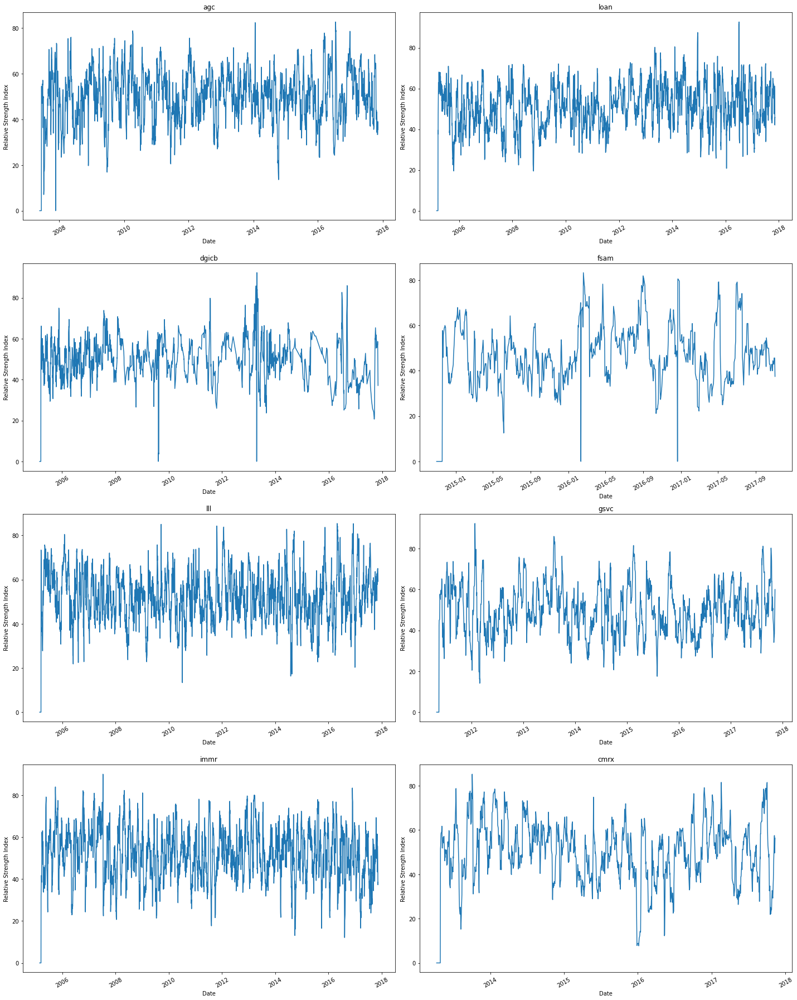

In [60]:
%matplotlib inline

# RSI Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['RSI_14D'])
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Relative Strength Index")
    plt.xticks(rotation=30)
fig.tight_layout()


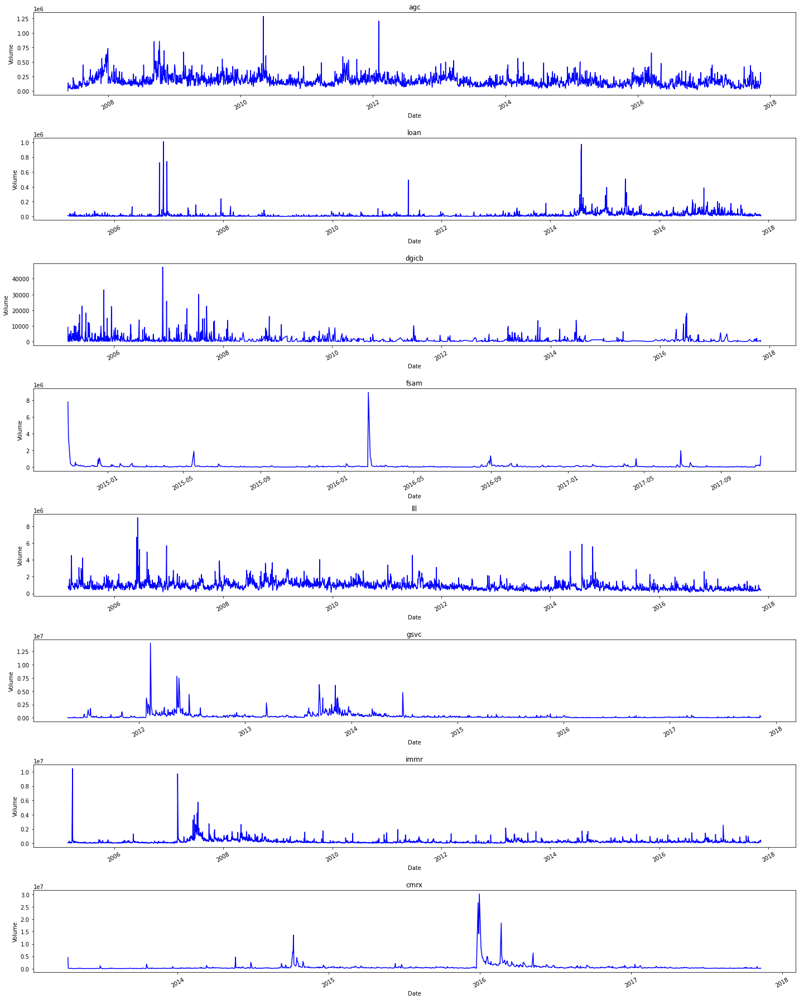

In [61]:
# Volume Plain plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume_plain'], 'b')
    ax.set_title(str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Volume")
    plt.xticks(rotation=30)
fig.tight_layout()

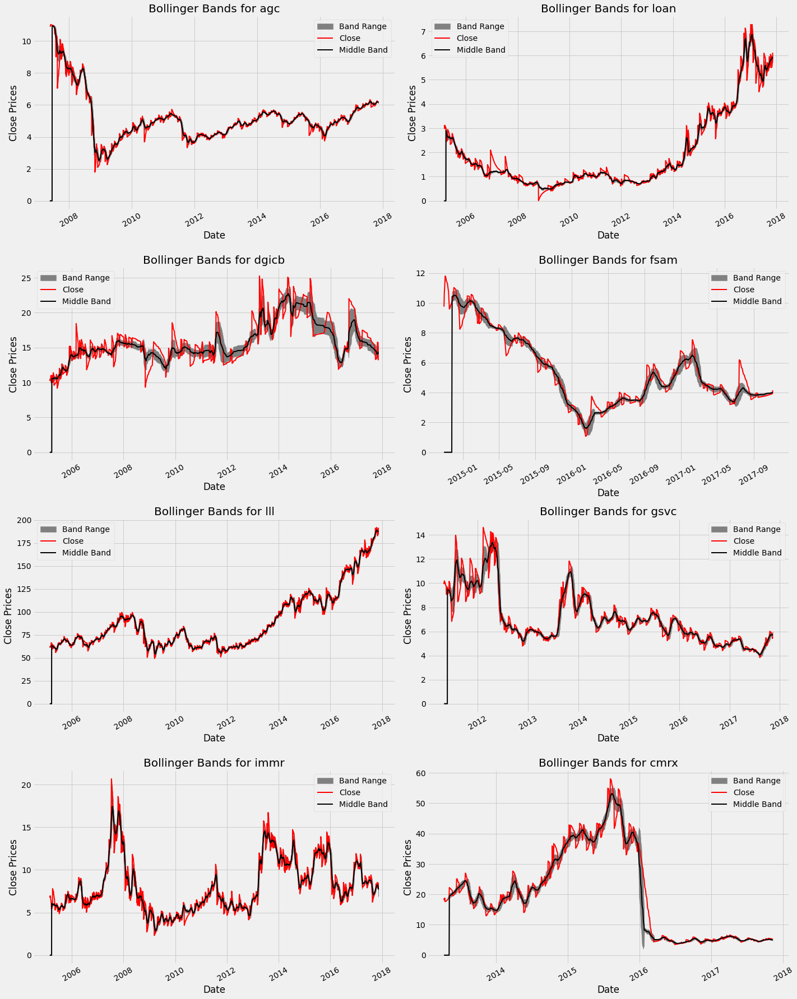

In [62]:
plt.style.use('fivethirtyeight')

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['BB_Upper_Band'], TechIndicator[i]['BB_Lower_Band'], color='grey', label="Band Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label="Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['BB_Middle_Band'], color='black', lw=2, label="Middle Band")
    ax.set_title("Bollinger Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()
#.dt.to_pydatetime()

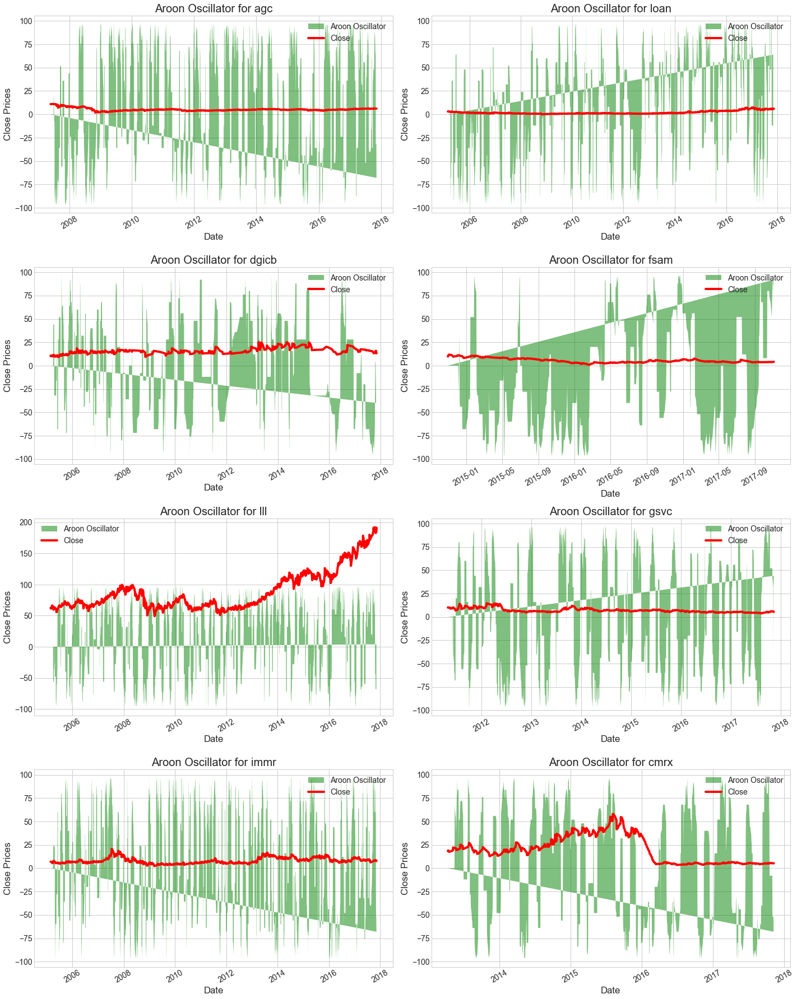

In [63]:
# Aroon Oscillator Plot
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill(TechIndicator[i].index, TechIndicator[i]['Aroon_Oscillator'],'g', alpha = 0.5, label = "Aroon Oscillator")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
    ax.set_title("Aroon Oscillator for " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

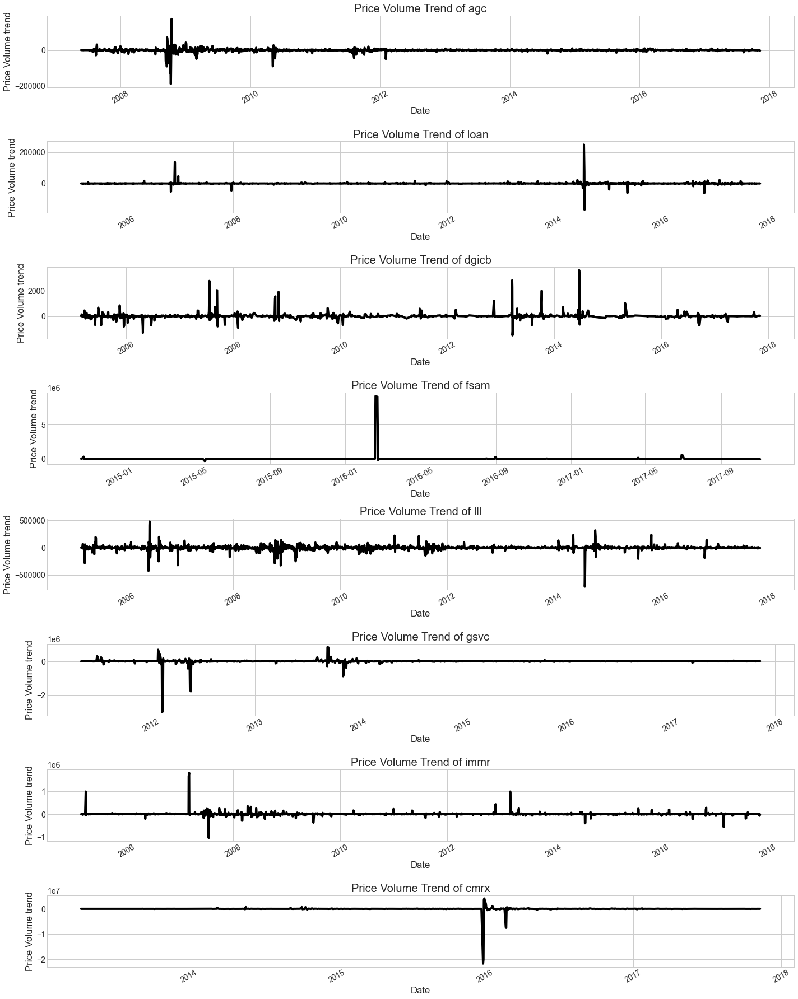

In [64]:
# PRice Volume Trend Plot
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(8,1,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['PVT'], 'black')
    ax.set_title("Price Volume Trend of " +str(TechIndicator[i]['Label'][0]))
    ax.set_xlabel("Date")
    ax.set_ylabel("Price Volume trend")
    plt.xticks(rotation=30)
fig.tight_layout()

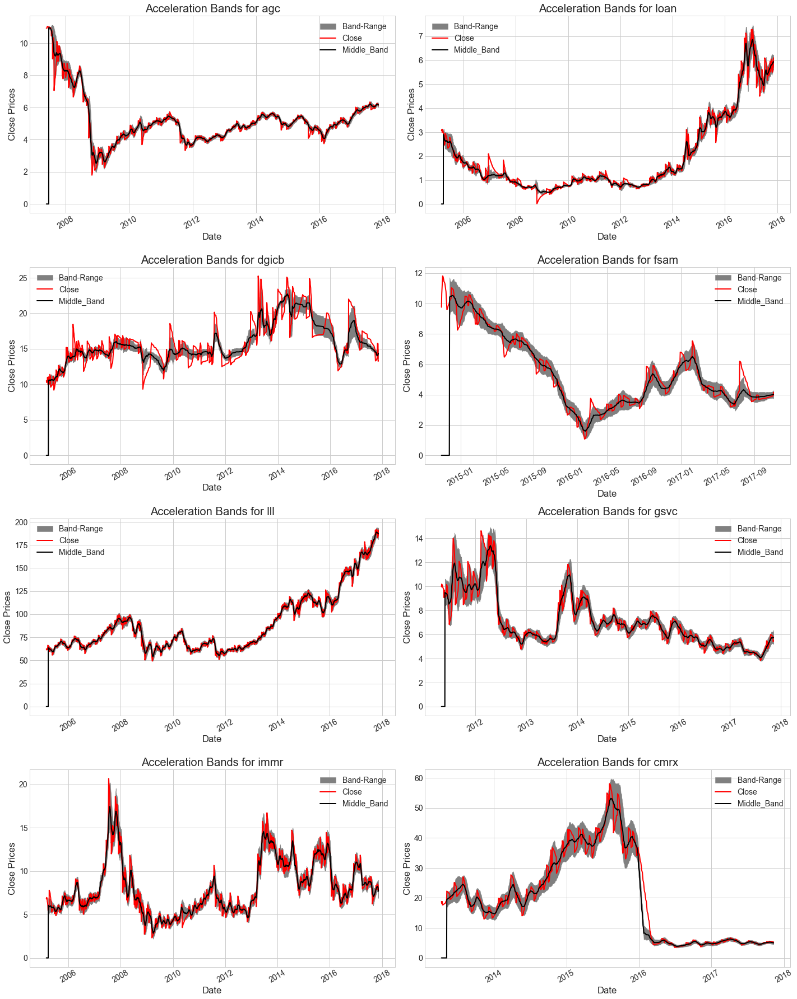

In [65]:
# Acceleration band Plot

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['AB_Upper_Band'], TechIndicator[i]['AB_Lower_Band'], color='grey', label = "Band-Range")
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', lw=2, label = "Close")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['AB_Middle_Band'], color='black', lw=2, label="Middle_Band")
    ax.set_title("Acceleration Bands for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

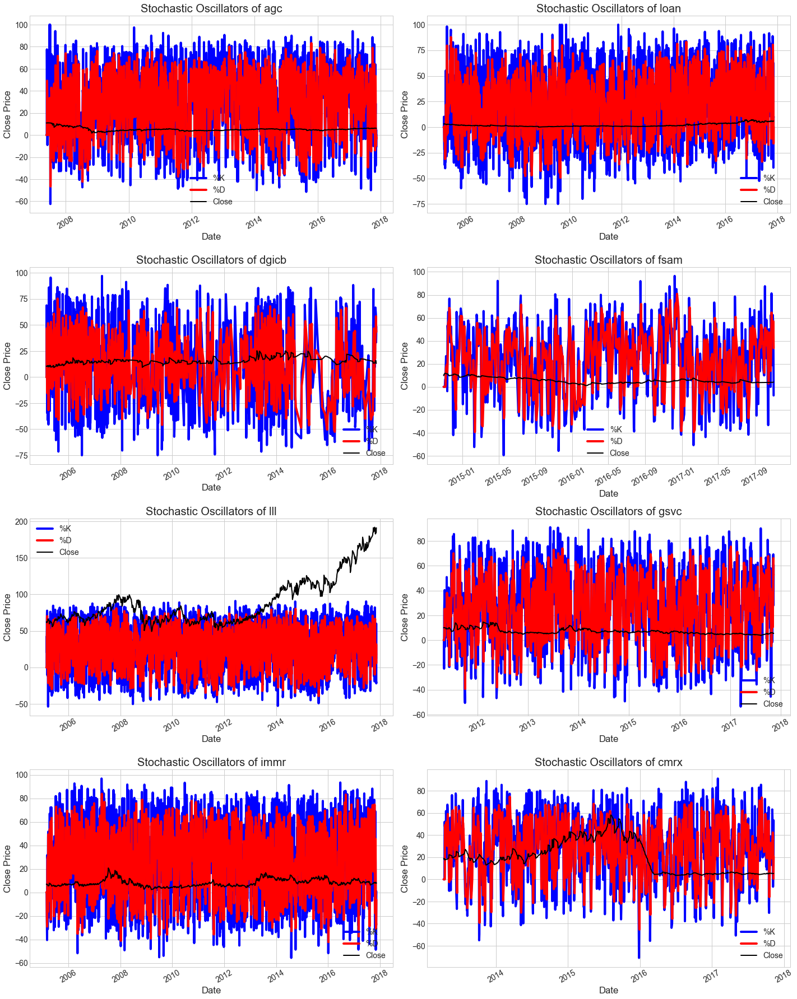

In [66]:
# Stochastic Oscillator plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOK'], 'blue', label="%K")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['STOD'], 'red', label="%D")
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='black', lw=2, label = "Close")
    ax.set_title("Stochastic Oscillators of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

C:\Users\safar\AppData\Local\Temp\ipykernel_168176\2331772754.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


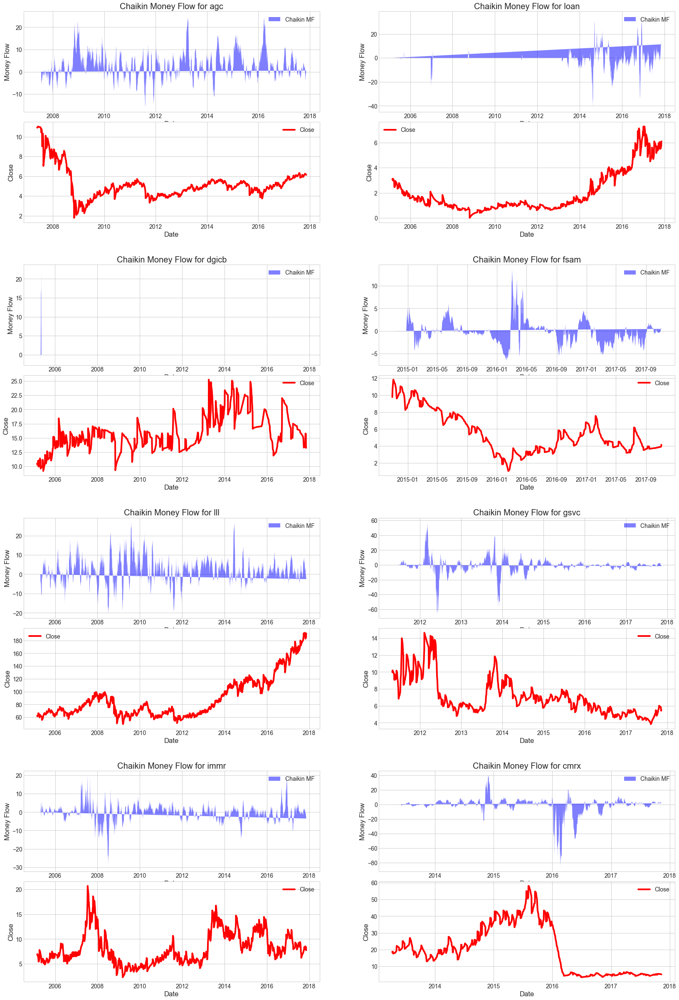

In [67]:
# Chaikin Money Flow Plots
import matplotlib.gridspec as gridspec

fig = plt.figure(figsize=(25,40))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(2, 1,
                    subplot_spec=outer[i], wspace=0.1, hspace=0.1)

    for j in range(2):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.fill(TechIndicator[i].index, TechIndicator[i]['Chaikin_MF'],'b', alpha = 0.5, label = "Chaikin MF")
            ax.set_title("Chaikin Money Flow for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Money Flow")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'r', label="Close")
            t = ax.set_ylabel("Close")
        ax.legend()
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

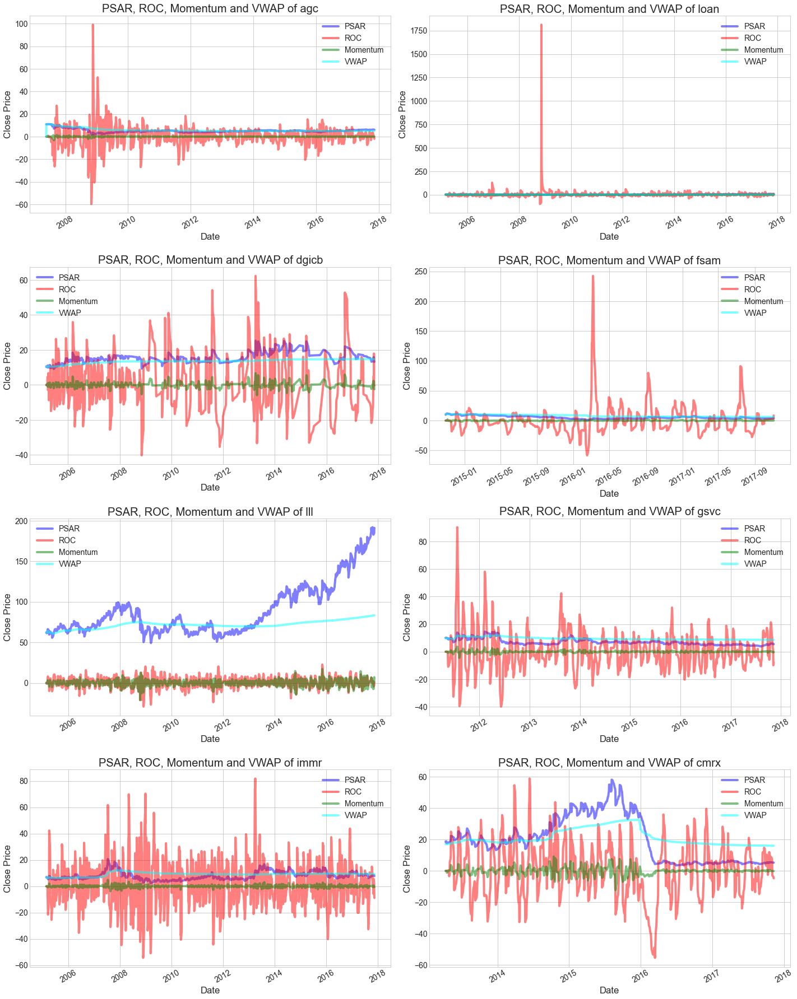

In [68]:
# Parabolic SAR, Rate of Change, Momentum and VWAP Plots
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['psar'], 'blue', label="PSAR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ROC'], 'red', label="ROC", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Momentum'], 'green', label="Momentum", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['VWAP'], 'cyan', label="VWAP", alpha = 0.5)
    ax.set_title("PSAR, ROC, Momentum and VWAP of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

C:\Users\safar\AppData\Local\Temp\ipykernel_168176\1685594315.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


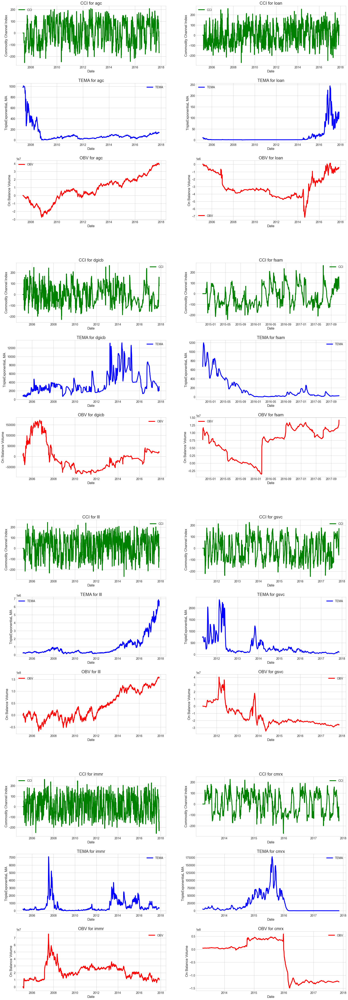

In [69]:
# Commodity Channel Index, Triple Exponential Moving Average On Banalance Volume Plots

fig = plt.figure(figsize=(25,80))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.3, hspace=0.3)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['CCI'], 'green', label="CCI")
            t = ax.set_title("CCI for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Commodity Channel Index")
        elif j == 1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['TEMA'], 'blue', label="TEMA")
            t = ax.set_title("TEMA for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("TripleExponentiaL MA")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['OBV'], 'red', label="OBV")
            t = ax.set_title("OBV for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("On Balance Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

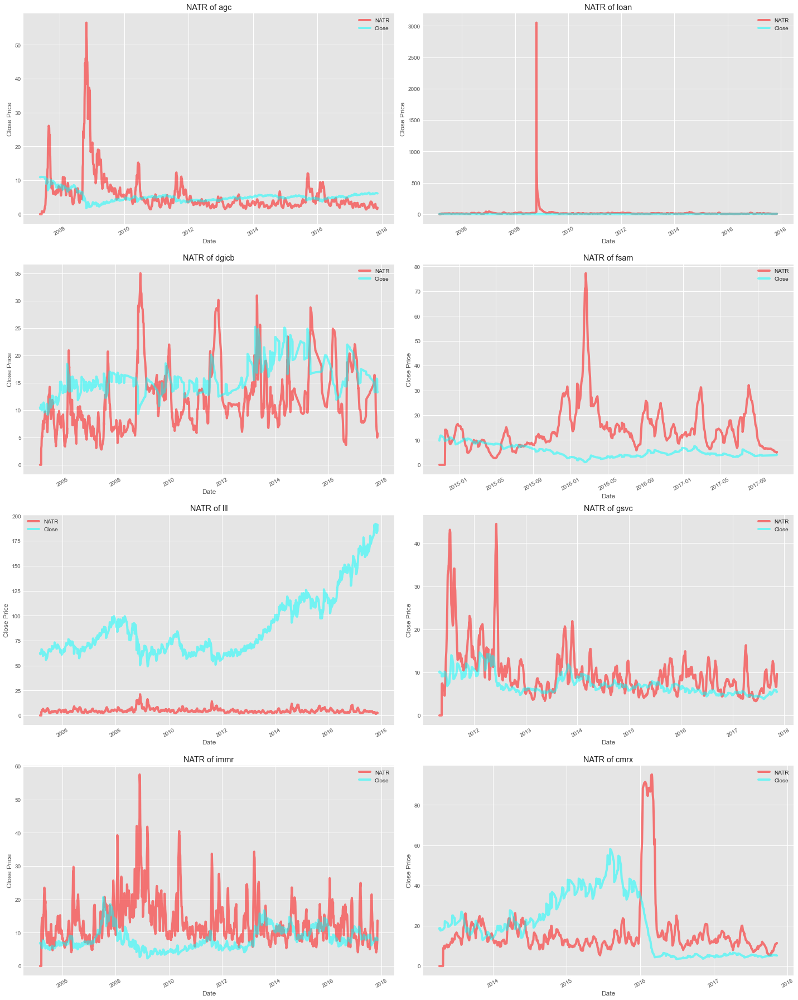

In [70]:
# Normalized Average True range Plots
plt.style.use('ggplot')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['NATR'], 'red', label="NATR", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'cyan', label="Close", alpha = 0.5)
    ax.set_title("NATR of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Price")
    plt.xticks(rotation=30)
fig.tight_layout()

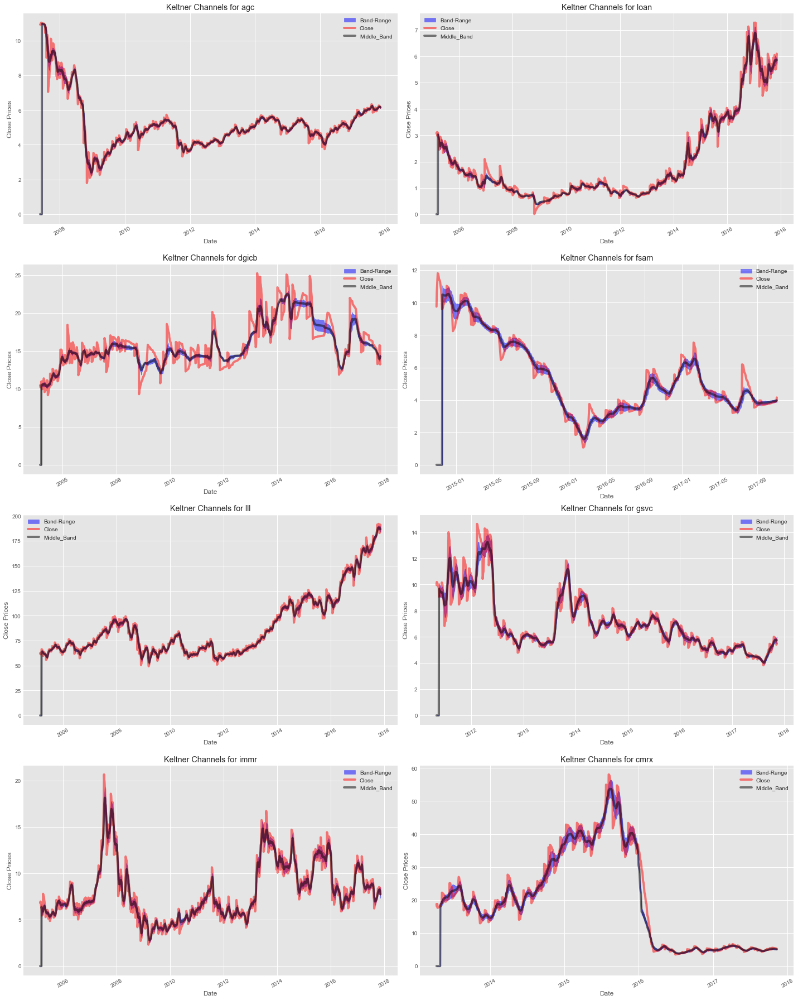

In [71]:
# Keltner Channels Plots

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['Kelch_Upper'], TechIndicator[i]['Kelch_Down'], 
                    color='blue', label = "Band-Range", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], color='red', label = "Close", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Kelch_Middle'], color='black', label="Middle_Band", alpha = 0.5)
    ax.set_title("Keltner Channels for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Close Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

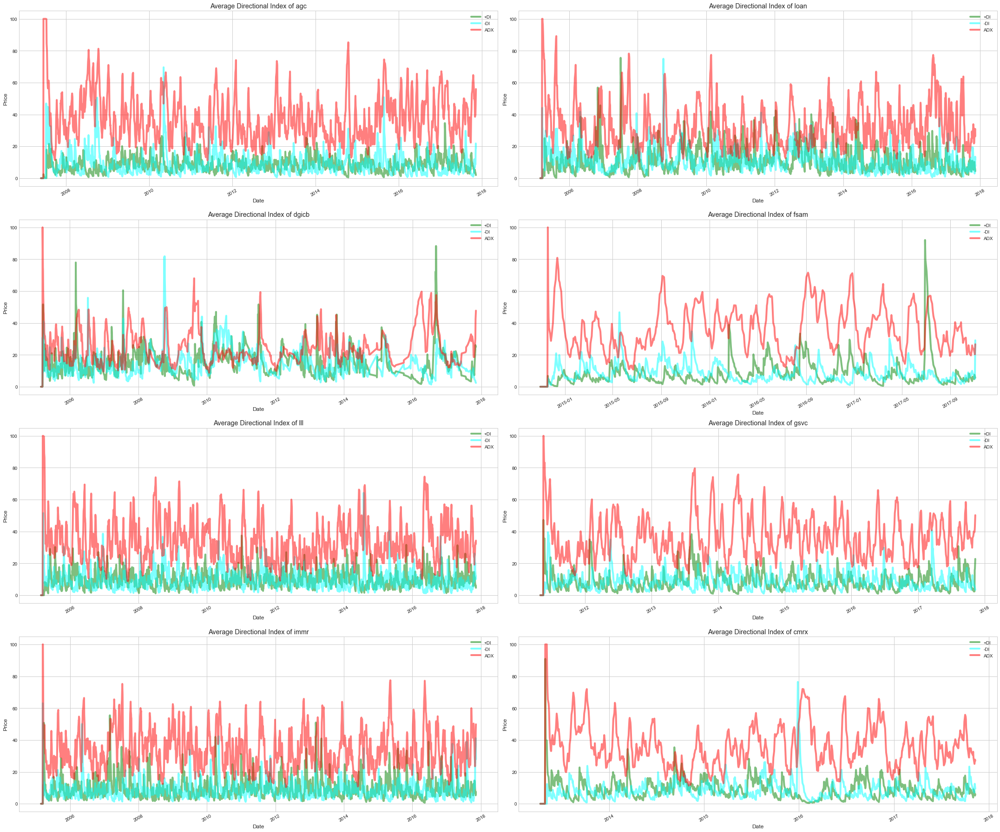

In [72]:
# Average Directional Index

plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(30,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['plusDI'], 'green', label="+DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['minusDI'], 'cyan', label="-DI", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['ADX'], 'red', label="ADX", alpha = 0.5)
    ax.set_title("Average Directional Index of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

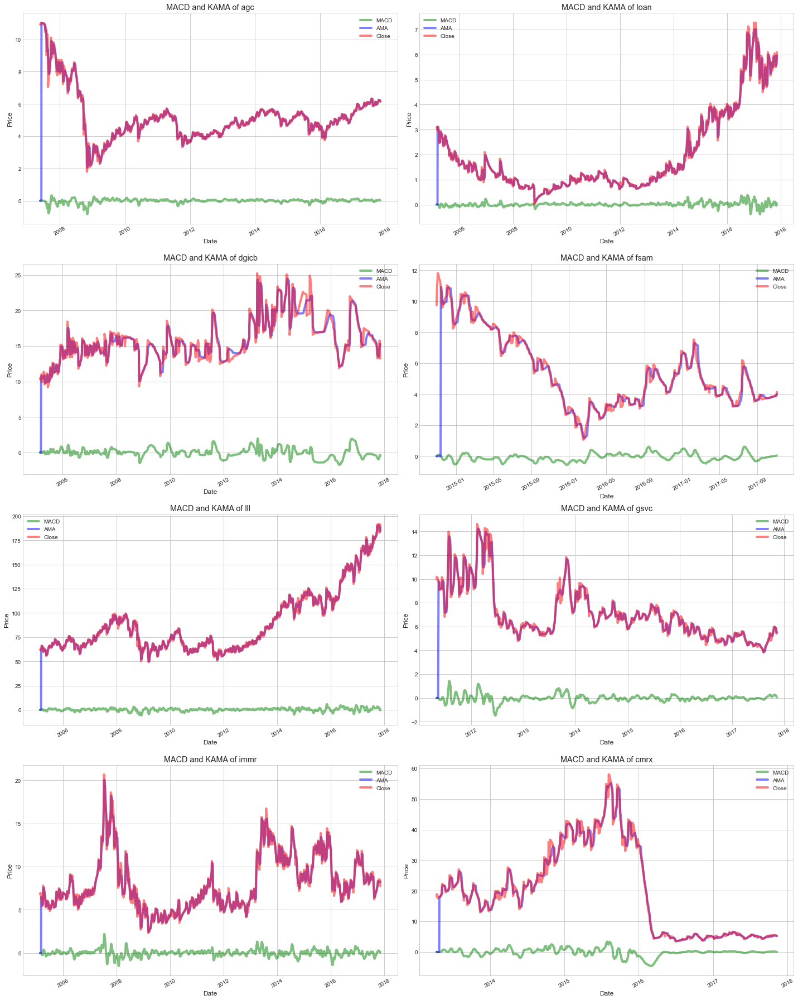

In [73]:
# Moving Average Convergence Divergence, Adaptive Moving Avergae Plots
plt.style.use('seaborn-whitegrid')
fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['MACD'], 'green', label="MACD", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['KAMA'], 'blue', label="AMA", alpha = 0.5)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['Close'], 'red', label="Close", alpha = 0.5)
    ax.set_title("MACD and KAMA of " +str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Price")
    plt.xticks(rotation=30)
fig.tight_layout()

C:\Users\safar\AppData\Local\Temp\ipykernel_168176\1192702742.py:31: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout()


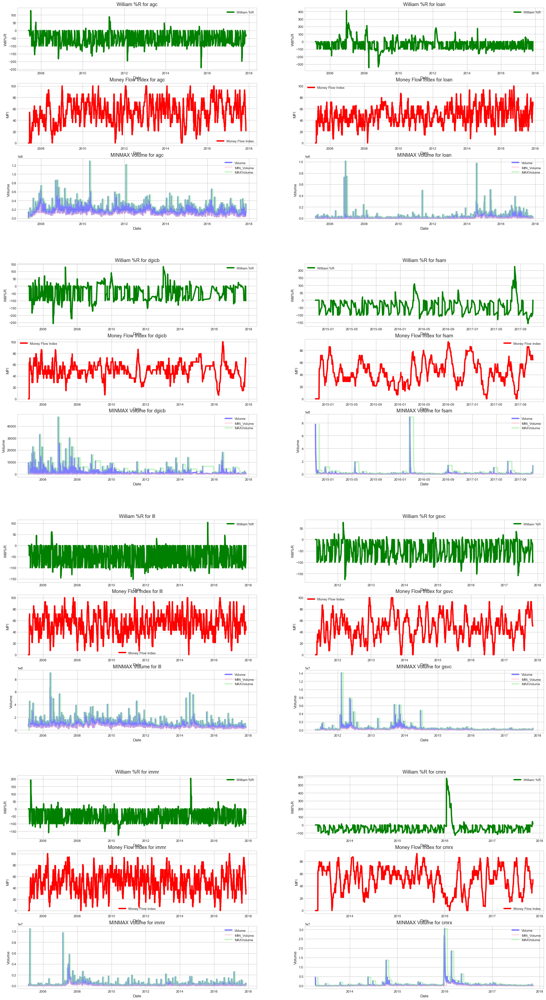

In [74]:
# William %R, Money Flow
fig = plt.figure(figsize=(25,50))
outer = gridspec.GridSpec(4, 2, wspace=0.2, hspace=0.2)

for i in range(8):
    inner = gridspec.GridSpecFromSubplotSpec(3, 1,
                    subplot_spec=outer[i], wspace=0.2, hspace=0.2)

    for j in range(3):
        ax = plt.Subplot(fig, inner[j])
        if j==0:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['WillR'], 'green', label="William %R")
            t = ax.set_title("William %R for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Will%R")
        elif j ==1:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Money_Flow_Index'], 'red', label="Money Flow Index")
            
            t = ax.set_title("Money Flow Index for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("MFI")
        else:
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['Volume'], 'blue', label="Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MIN_Volume'], 'pink', label="MIN_Volume", alpha = 0.5)
            t = ax.plot(TechIndicator[i].index, TechIndicator[i]['MAX_Volume'], 'lightgreen', label="MAXVolume",  alpha = 0.5)
            t = ax.set_title("MINMAX Volume for " +str(TechIndicator[i]['Label'][0]))
            t = ax.set_ylabel("Volume")
        ax.legend()
        #ax.set_title("CCI, TEMA, OBV for " +str(techindi2[i]['Label'][0]))
        ax.set_xlabel("Date")
        
        fig.add_subplot(ax)
fig.tight_layout()

In [ ]:
# ichimoku Plots turning_line	standard_line	ichimoku_span1	ichimoku_span2	chikou_span

fig = plt.figure(figsize=(20,25))
for i in range(8):
    ax = plt.subplot(4,2,i+1)
    ax.fill_between(TechIndicator[i].index, TechIndicator[i]['ichimoku_span1'], TechIndicator[i]['ichimoku_span2'], 
                    color='blue', label = "ichimoku cloud", alpha = 0.5)
    # Plot Adjust Closing Price and Moving Averages
    ax.plot(TechIndicator[i].index, TechIndicator[i]['turning_line'], color='red', label = "Tenkan-sen", alpha = 0.4)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['standard_line'], color='cyan', label="Kijun-sen", alpha = 0.3)
    ax.plot(TechIndicator[i].index, TechIndicator[i]['chikou_span'], color='green', label="Chikou-span", alpha = 0.2)
    ax.set_title("Ichimoku for " + str(TechIndicator[i]['Label'][0]))
    ax.legend()
    ax.set_xlabel("Date")
    ax.set_ylabel("Prices")
    plt.xticks(rotation=30)
fig.tight_layout()

I have also tried prediction of movement of stock market based on this data. You can refer to that kernel here: https://www.kaggle.com/kratisaxena/lstm-gru-models-for-stock-movement-analysis